# Assignment 9
# DA24C005

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, TSNE
from matplotlib import offsetbox
import random

In [82]:
df = pd.read_csv('/kaggle/input/visual-taxonomy/train.csv')

In [83]:
df.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [84]:
df['Category'].value_counts()

Category
Women Tops & Tunics    19004
Women Tshirts          18774
Sarees                 18346
Men Tshirts             7267
Kurtis                  6822
Name: count, dtype: int64

In [85]:
df.columns

Index(['id', 'Category', 'len', 'attr_1', 'attr_2', 'attr_3', 'attr_4',
       'attr_5', 'attr_6', 'attr_7', 'attr_8', 'attr_9', 'attr_10'],
      dtype='object')

In [86]:
df.describe(include = 'all')

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
count,70213.000000,70213,70213.000000,51867,55192,54698,59888,56493,38116,41415,37474,33565,24999
unique,NaN,5,NaN,18,14,10,19,14,7,11,10,13,8
top,NaN,Women Tops & Tunics,NaN,default,regular,regular,printed,casual,short sleeves,regular sleeves,zari woven,regular sleeves,no
freq,NaN,19004,NaN,9268,17222,15546,14285,12358,13703,14661,13533,7480,14835
mean,35254.985872,NaN,8.850569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,20295.174166,NaN,1.559819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,17718.000000,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,35272.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,52825.000000,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## TASK 1

#### I made a list of categories and attributes. For each category, I randomly sampled two attributes. For each (category, attribute) pair, it creates a basket of 100 randomly sampled datasamples. In case, the particular category, attribute pair doesn't have enough (i.e. 100 samples) then another attribute is randomly sampled.

In [87]:
categories = df['Category'].unique().tolist()
samples = {}
category_attr = {}
random.seed(42)

for category in categories:
    attributes = df.columns[3:13].tolist()
    selected_attrs = []
    i = 0

    while i < 2:
        attr = random.choice(attributes)
        basket = df[(df['Category'] == category) & (df[attr].notna())]

        if len(basket) >= 100:
            samples[f'{category}-{attr}'] = basket['id'].sample(100).tolist()
            selected_attrs.append(attr)
            i += 1
            attributes.remove(attr)

    category_attr[category] = selected_attrs 


In [88]:
print(*samples.keys())

Men Tshirts-attr_2 Men Tshirts-attr_1 Sarees-attr_5 Sarees-attr_4 Kurtis-attr_4 Kurtis-attr_3 Women Tshirts-attr_2 Women Tshirts-attr_3 Women Tops & Tunics-attr_10 Women Tops & Tunics-attr_7


#### The dictionary samples contains each (category,attribute) pair as the key and it's corresponding basket containing the randomly sampled 100 data samples are the values of the dictionary.

In [89]:
category_table = pd.DataFrame.from_dict(category_attr, orient='index', columns=['Attribute 1', 'Attribute 2']).reset_index()
category_table.columns = ['Category', 'Attribute 1', 'Attribute 2']
category_table

,Category,Attribute 1,Attribute 2
0,Men Tshirts,attr_2,attr_1
1,Sarees,attr_5,attr_4
2,Kurtis,attr_4,attr_3
3,Women Tshirts,attr_2,attr_3
4,Women Tops & Tunics,attr_10,attr_7


#### This table shows the choice of attributes for each category

# Task 2 & Task 3

### We visualise each basket (100 data samples corresponding to each (category, attribute) pair) using Isomap and tSNE. After each visualisation, I have written my interpretation regarding the patterns in each visualisations.

#### This function processes a list of image ids by loading, resizing and preparing each image for further analysis. In the end,it returns both the flattened array of images and the list of resized images, which is useful for visualization.

In [90]:
def preprocess_images(ids):
    imgs = []
    act_imgs = []
    
    for id in ids:
        f_id = str(id).zfill(6)
        img_path = f"/kaggle/input/visual-taxonomy/train_images/{f_id}.jpg"
        img = Image.open(img_path)
        img = img.resize((64, 64))
        imgs.append(np.array(img).flatten())
        act_imgs.append(img)
    
    return np.array(imgs), act_imgs


#### this function projects high-dimensional data onto a 2D plane using a model like ISOMAP or t-SNE and provides visualisation of the result

In [91]:
def plot_embeddings(data, model, imgs=None, ax=None,thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()
    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    if imgs is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_imgs = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_imgs) ** 2, 1)
            if np.min(dist) < min_dist_2:
                continue
            shown_imgs = np.vstack([shown_imgs, proj[i]])
            imgbox = offsetbox.AnnotationBbox(offsetbox.OffsetImage(imgs[i], cmap=cmap),proj[i])
            ax.add_artist(imgbox)

#### We print the uniuque values of each atribute. We do this so that we get insights to find meaningful patterns in the visualisations.

In [92]:
for col in df.columns[3:13]:
    values = df[col].unique()
    print(f"{col}")
    print(f"Unique Values: {values}")
    print("-" * 30)


attr_1
Unique Values: ['default' 'multicolor' 'black' 'white' nan 'same as saree' 'solid'
 'same as border' 'red' 'navy blue' 'maroon' 'green' 'pink' 'blue'
 'purple' 'grey' 'yellow' 'orange' 'peach']
------------------------------
attr_2
Unique Values: ['round' 'polo' nan 'woven design' 'zari' 'no border' 'solid' 'default'
 'temple border' 'straight' 'a-line' 'loose' 'boxy' 'regular' 'fitted']
------------------------------
attr_3
Unique Values: ['printed' 'solid' nan 'small border' 'big border' 'no border'
 'knee length' 'calf length' 'long' 'crop' 'regular']
------------------------------
attr_4
Unique Values: ['default' 'solid' nan 'typography' 'multicolor' 'cream' 'white'
 'navy blue' 'yellow' 'green' 'pink' 'daily' 'party' 'printed' 'high'
 'round neck' 'stylised' 'sweetheart neck' 'v-neck' 'square neck']
------------------------------
attr_5
Unique Values: ['short sleeves' 'long sleeves' nan 'party' 'traditional' 'daily'
 'wedding' 'net' 'default' 'quirky' 'solid' 'graphic' 'fun

In [93]:
isomap = Isomap(n_neighbors=5, n_components=2)
tsne = TSNE(n_components = 2, random_state = 42)


In [94]:
category_attr.keys()

dict_keys(['Men Tshirts', 'Sarees', 'Kurtis', 'Women Tshirts', 'Women Tops & Tunics'])

## Men's Tshirts

In [95]:
category_attr['Men Tshirts']

['attr_2', 'attr_1']

In [96]:
imgs, act_imgs = preprocess_images(samples[f'Men Tshirts-attr_2']) 

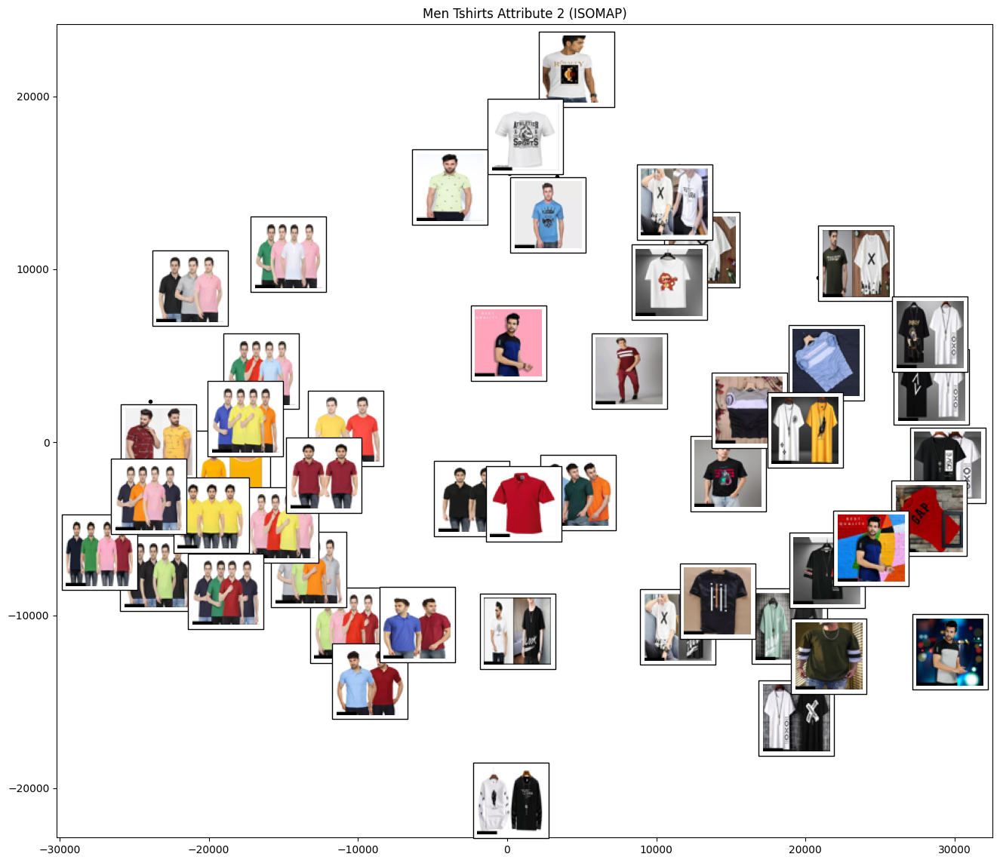

In [97]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Men Tshirts Attribute 2 (ISOMAP)")
plt.gcf().set_size_inches(16, 14)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the number of people/tshirts in an image decrease as we go from left to right. On the leftmost pictures, the number of models are 4 and on the rightmost pictures there are no models. Component: Number of people
#### - Along the y-axis, we observe that background colour darkens as we move from down to up. The bottomest pictures have white as the background colour and the topmost pictures have black as the background colour. Component: Background colour intensity

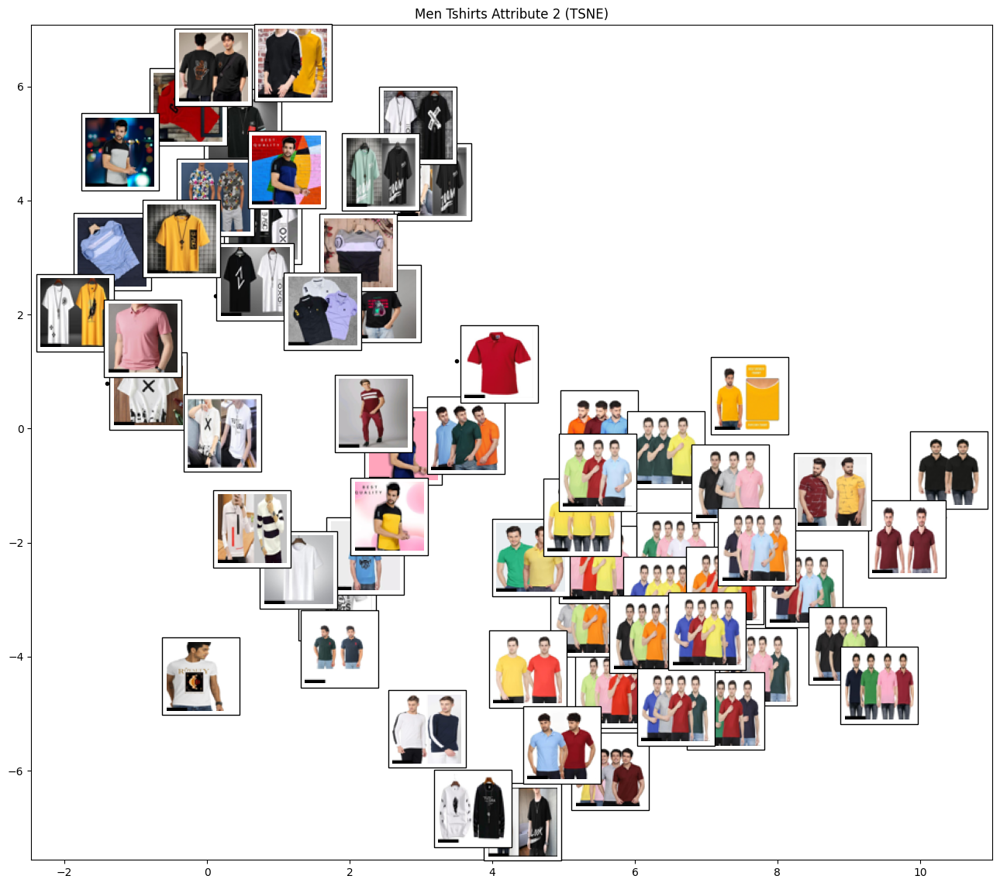

In [98]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Men Tshirts Attribute 2 (TSNE)")
plt.gcf().set_size_inches(16, 14)
plt.show()

### Patterns:
#### - Along the x-axis, the number of people/tshirts in an image increase from left to right. Component: Number of people
#### - Along the y-axis,the background colour transitions from dark colours to lighter ones as we move from down to up. Component: Background colour intensity

In [99]:
imgs, act_imgs = preprocess_images(samples[f'Men Tshirts-attr_1']) 

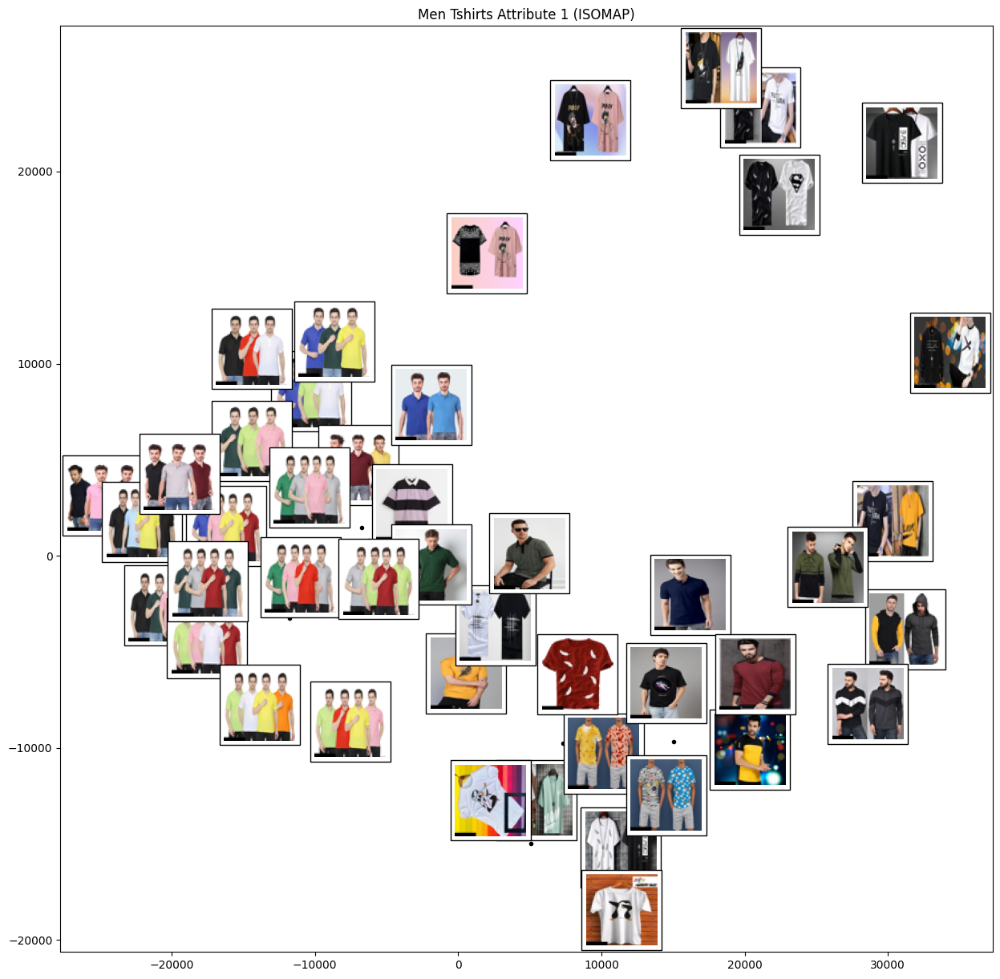

In [100]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Men Tshirts Attribute 1 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we can observe that the background colour darkens as we from left to right. Component: Background colour intensity
#### - Along the y-axis, we observe that the colour of the tshirts get lighter as we move from down to up. The bottomost pics have black colour tshirts whereas the tshirts on the top are of white colour. Component: Tshirt colour intensity

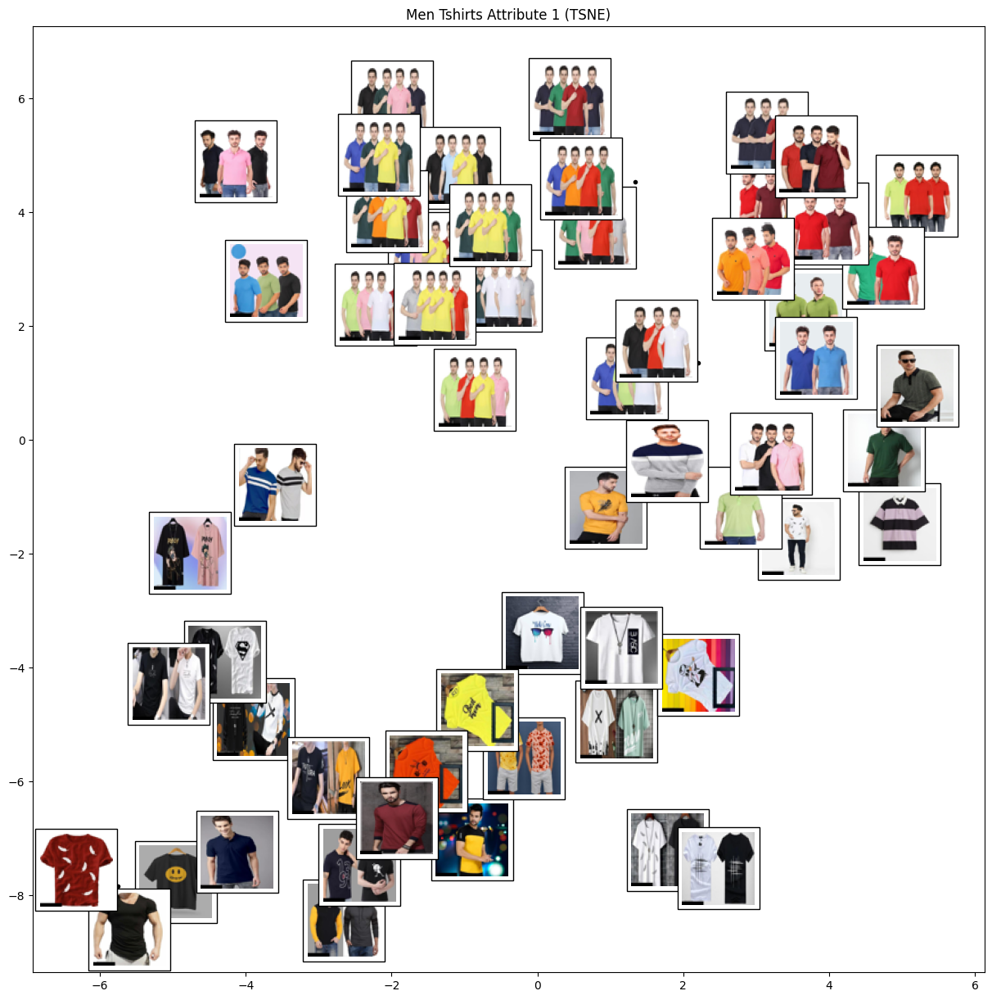

In [101]:
plot_embeddings(imgs, tsne, act_imgs)
plt.title(f"Men Tshirts Attribute 1 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the design complexity of the tshirts increase as we move from left to right. The leftmost tshirts are plain coloured tshirts but the rightmost tshirts have designs on them. Component: Design complexity of the tshirt
#### - Along the y-axis, the number of people in the pictures increase from top to down. Component: Number of people in each image

## Sarees

In [102]:
category_attr['Sarees']

['attr_5', 'attr_4']

In [103]:
imgs, act_imgs = preprocess_images(samples[f'Sarees-attr_5']) 

/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


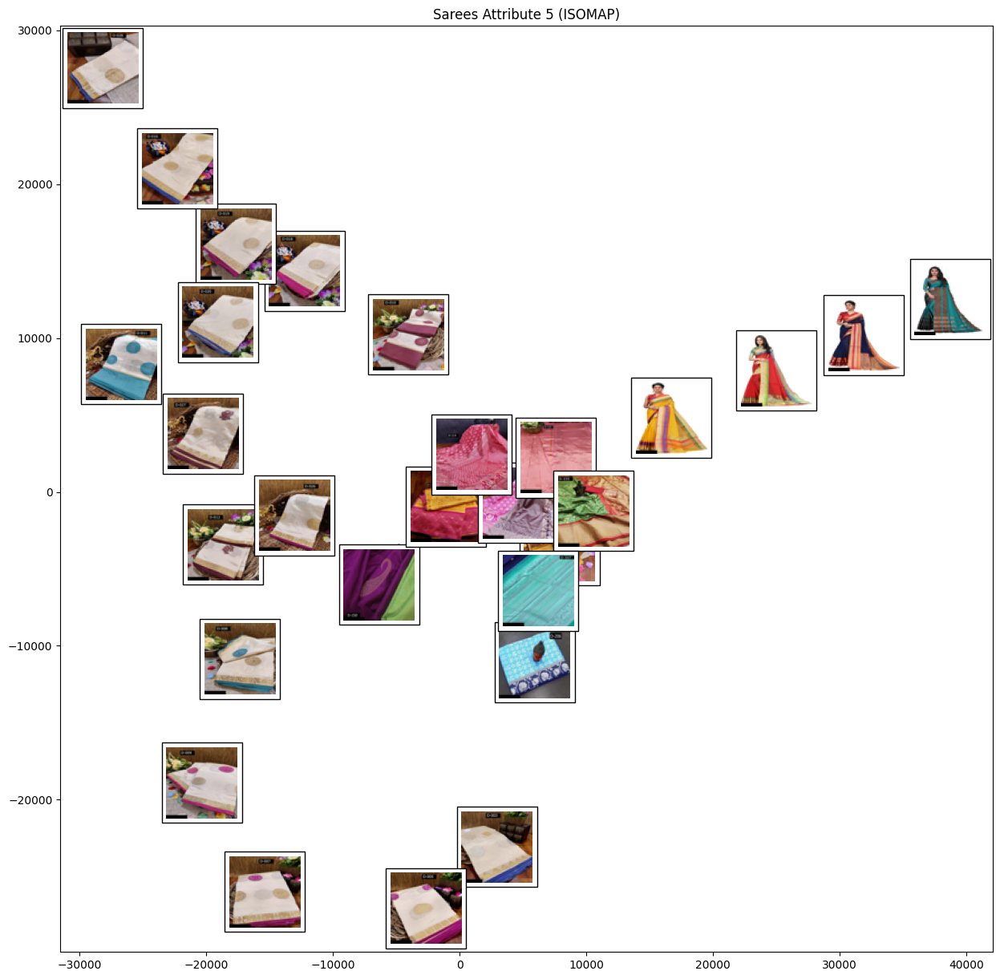

In [104]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Sarees Attribute 5 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis,the pattern that can be observed is the tilt of the sarees. The rightmost saree pictures make an acute angle with the positve x-axis but the leftmost ones make a obtuse angle. Component: Tilt (angle) of the sarees
#### - Along the y-axis,we observe that the saree pictures in the bottom have plain patterns whereas the pictures in the top have colourful and slightly complex patterns. Component: Pattern complexity

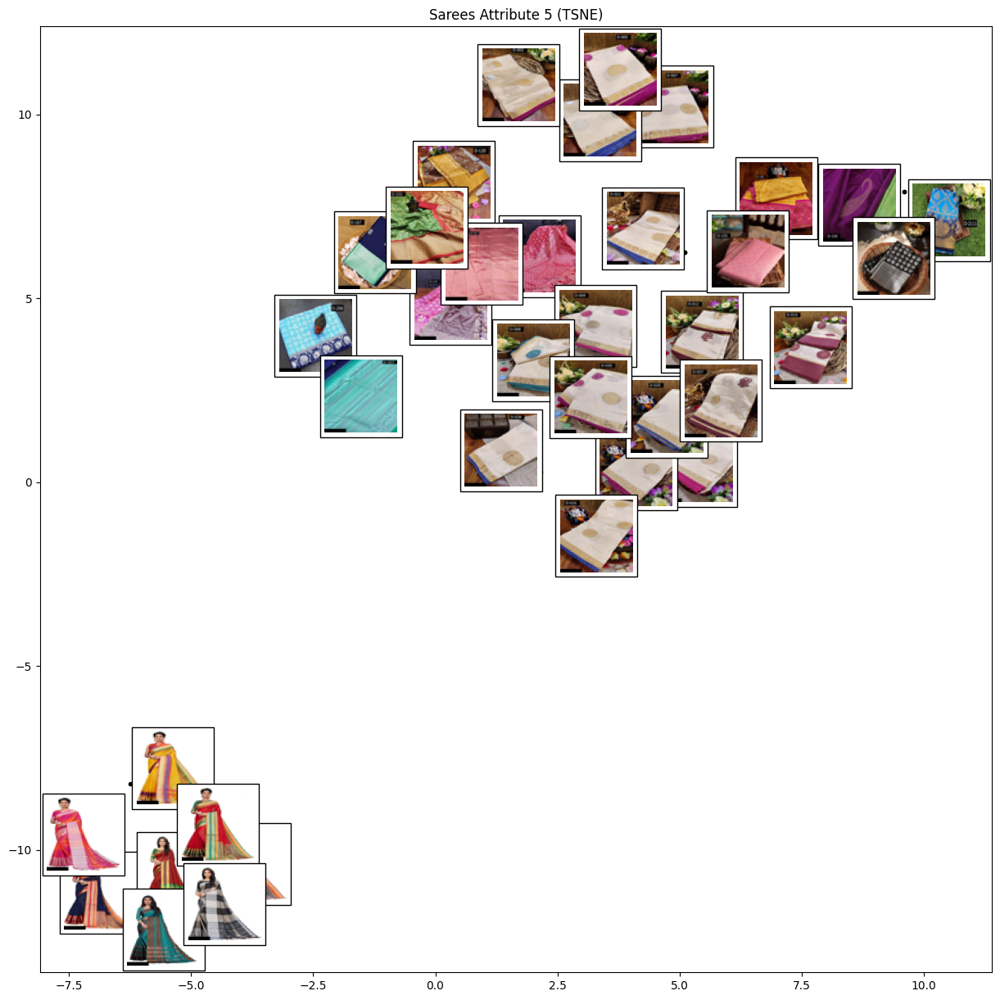

In [105]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Sarees Attribute 5 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the sarees on the right are plain (white colour) while sarees are on the right are colourful and have designs.Component: Design complexity

#### - Along the y-axis, we observe that the bottom saree pictures have a person in them while the pictures which are above do not have a person. Component: Presence or absence of a person

In [106]:
imgs, act_imgs = preprocess_images(samples[f'Sarees-attr_4']) 


/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


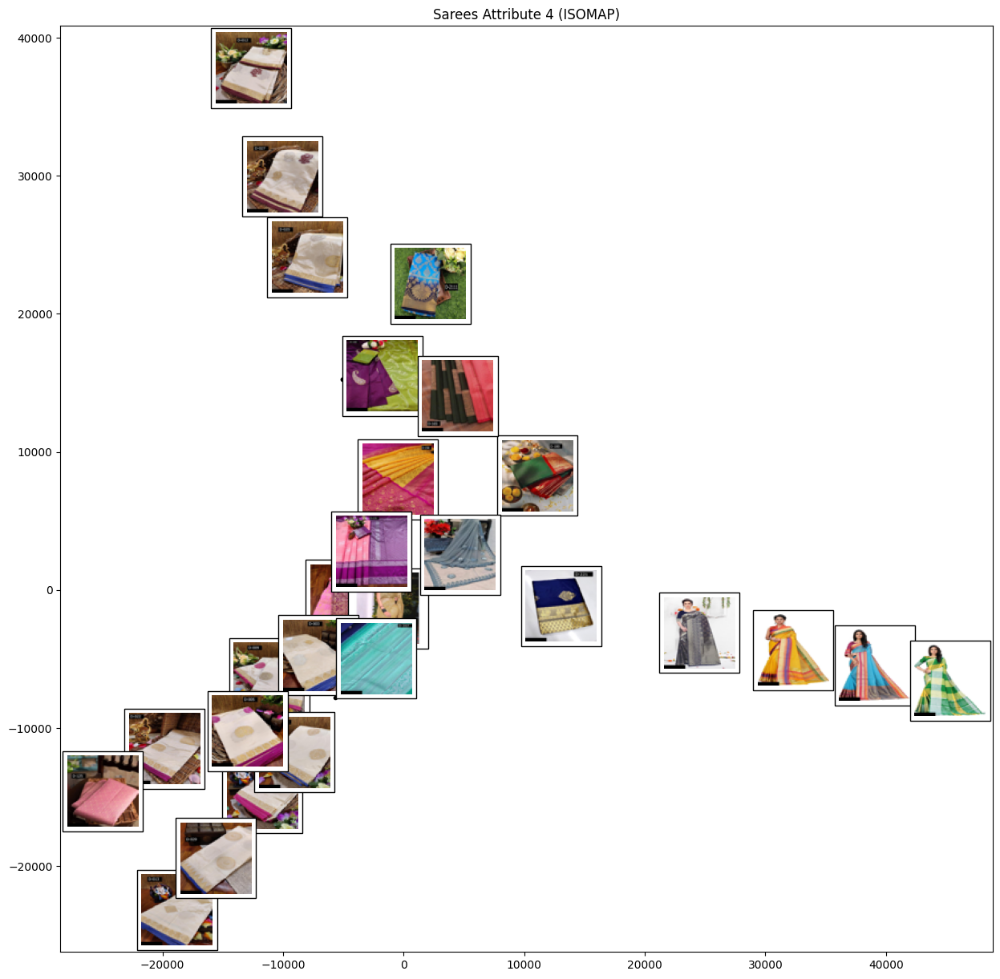

In [107]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Sarees Attribute 4 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### We cannot observe any visible pattern from this visualisation.

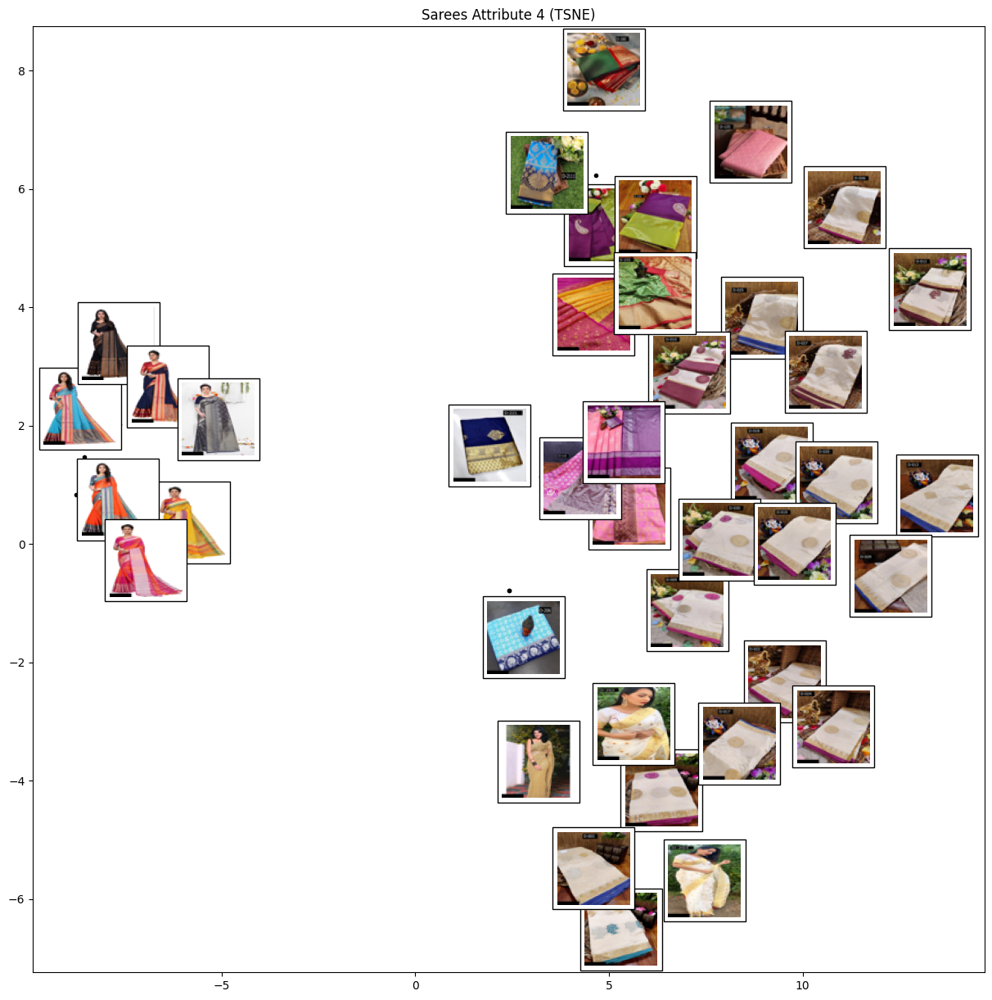

In [108]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Sarees Attribute 4 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

#### We cannot observe any meaningful pattern in this visualation

## Kurtis

In [109]:
category_attr['Kurtis']

['attr_4', 'attr_3']

In [110]:
imgs, act_imgs = preprocess_images(samples[f'Kurtis-attr_4']) 


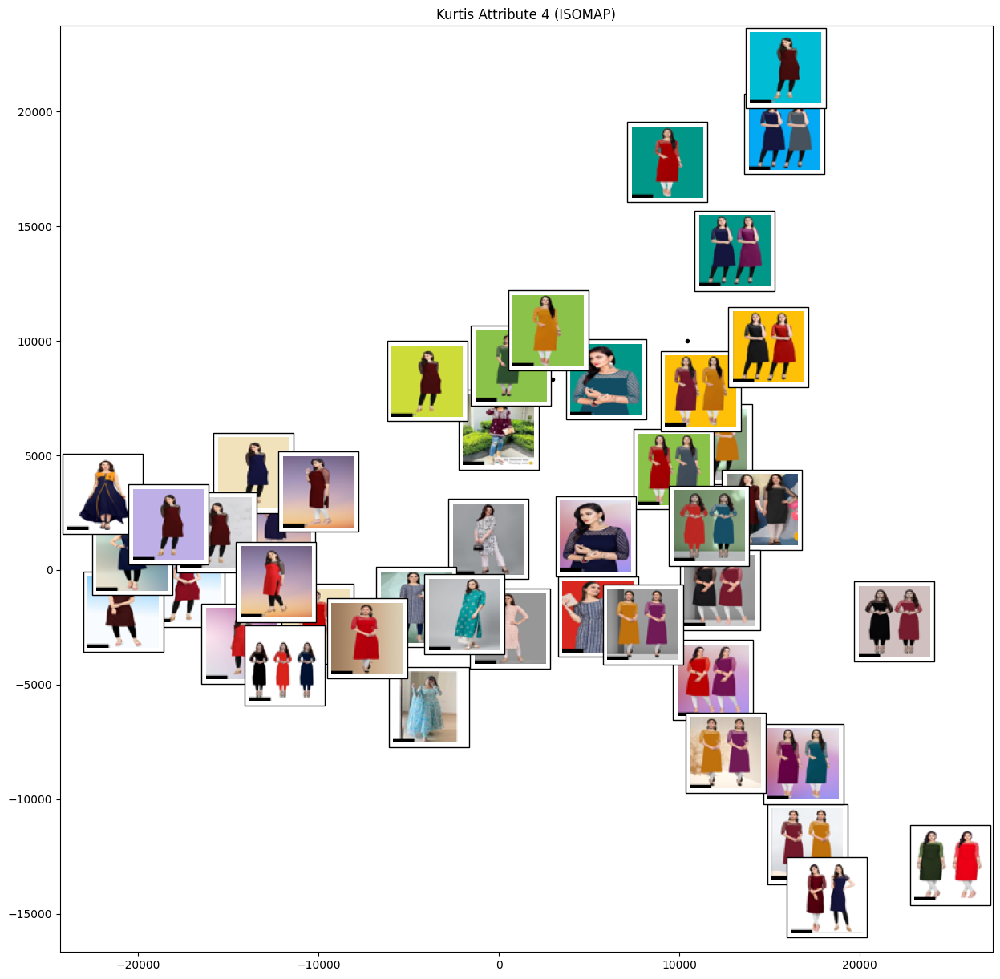

In [111]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Kurtis Attribute 4 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

#### Along the x-axis, as we move from the left to right, the background colour of the pictures transition from dark to light (white). Component: Background colour intensity
#### No meaningful pattern is learnt from this visualisation

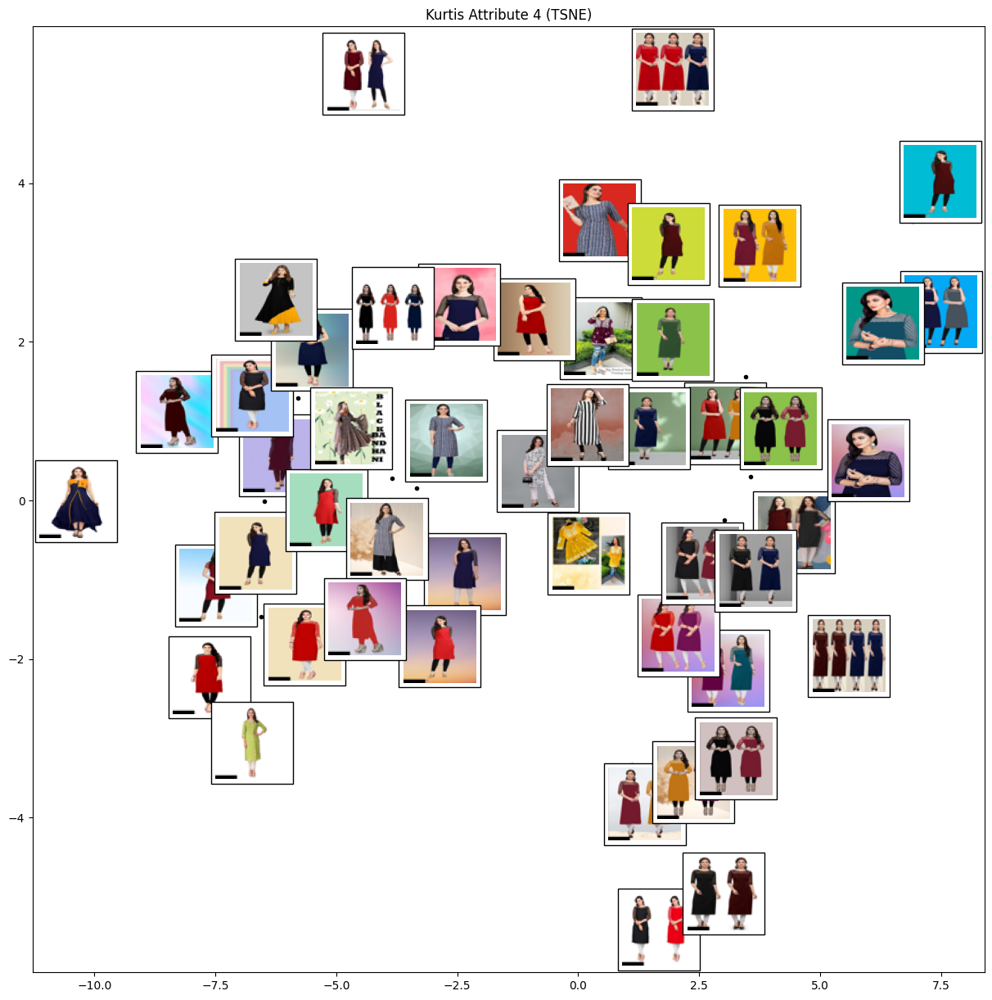

In [112]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Kurtis Attribute 4 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

#### We cannot observe any meaningful pattern in the images

In [113]:
imgs, act_imgs = preprocess_images(samples[f'Kurtis-attr_3']) 

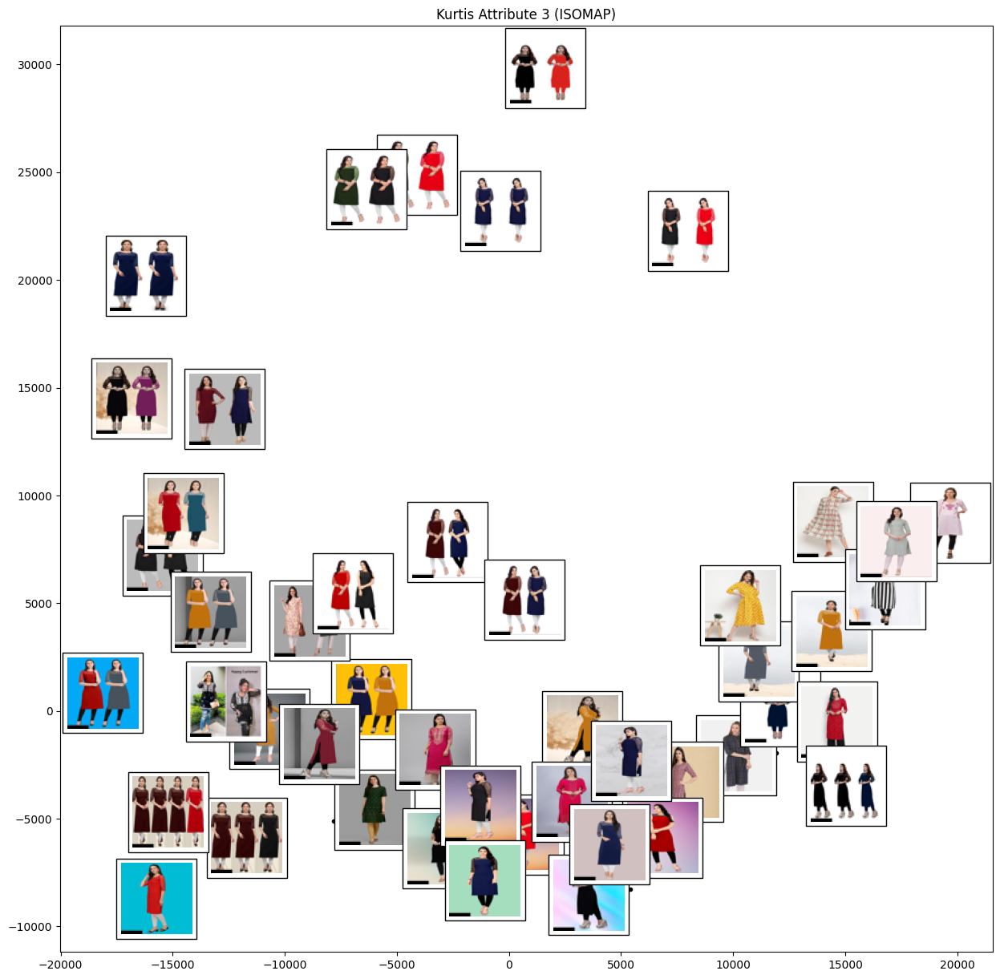

In [114]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Kurtis Attribute 3 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

#### We cannot find any patterns in this visualtion

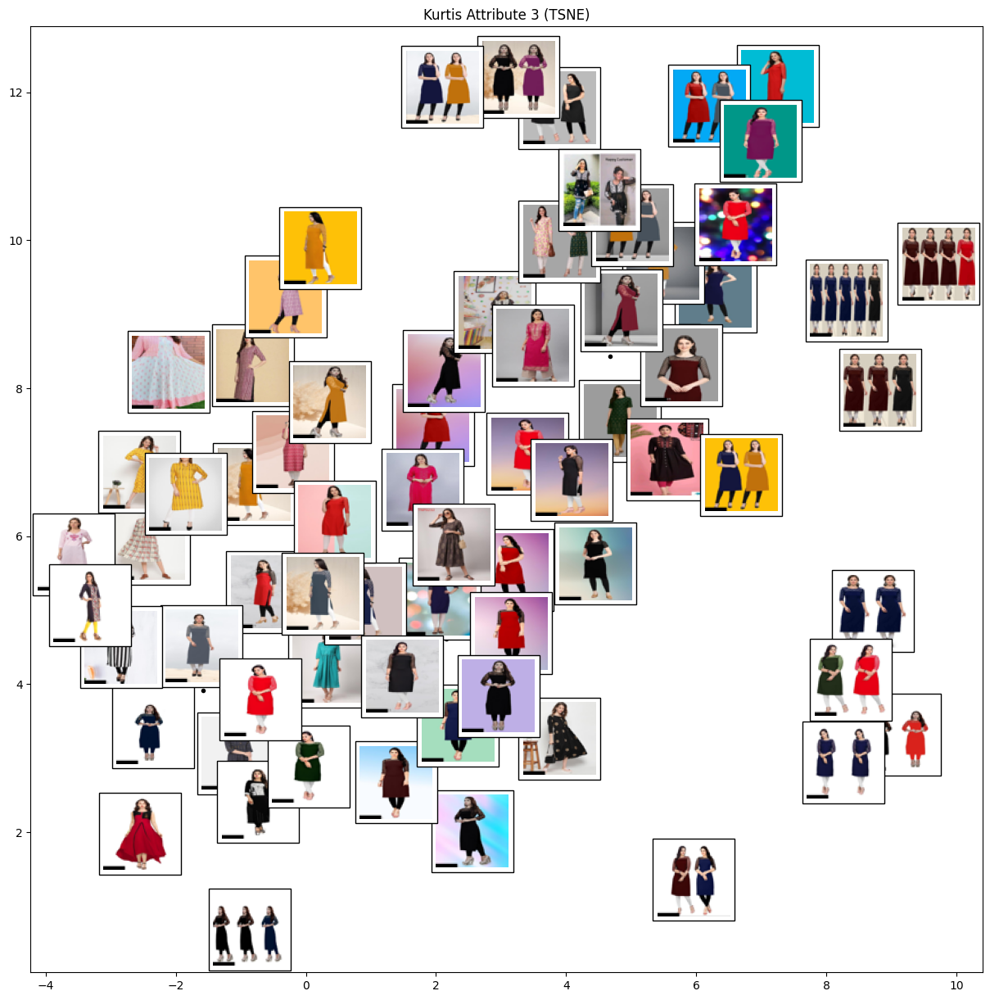

In [115]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Kurtis Attribute 3 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

#### As we move upwards along the y axis, we observe that the background colour of the pictures lightens. Component: Background colour intensity
#### As we move from left to right, the number of people in each picture decreases from 4 to 1. Component: number of people in each image

## Women Tshirts

In [116]:
category_attr['Women Tshirts']


['attr_2', 'attr_3']

In [117]:
imgs, act_imgs = preprocess_images(samples[f'Women Tshirts-attr_2']) 


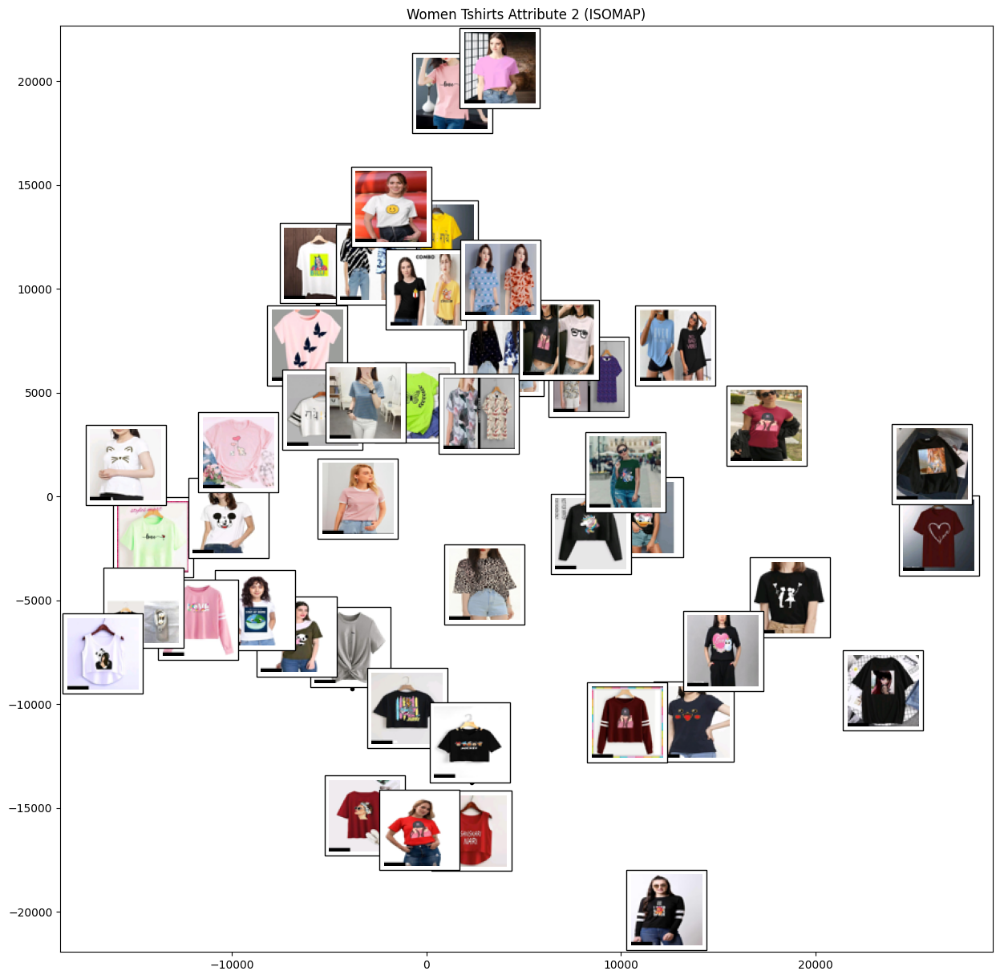

In [118]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Women Tshirts Attribute 2 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, the colour of the tshirts transition from light to dark as we move from left to right. Component; Tshirt colour intenstiy
#### - Along the y-axis, we observe that the pictures on the top have a person in the picture while the lower pictures dont. Component: Presence/absence of person

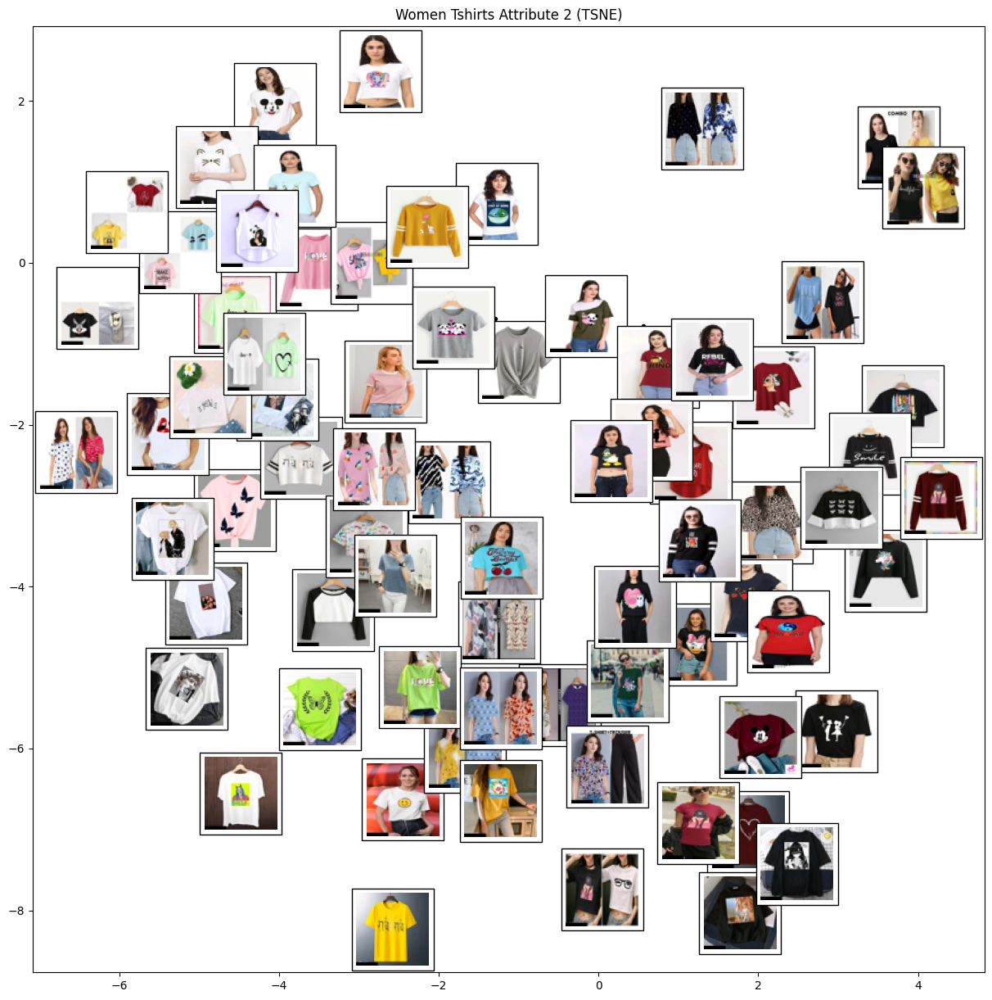

In [119]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Women Tshirts Attribute 2 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

#### As we move from left to right (x-axis), the number of tshirts in each image increase. Component: Number of tshirts
#### As we move from down to up (y-axis), the colour of the tshirts darken from white to darker colours. Component: Tshirt colour intensity

In [120]:
imgs, act_imgs = preprocess_images(samples[f'Women Tshirts-attr_3']) 

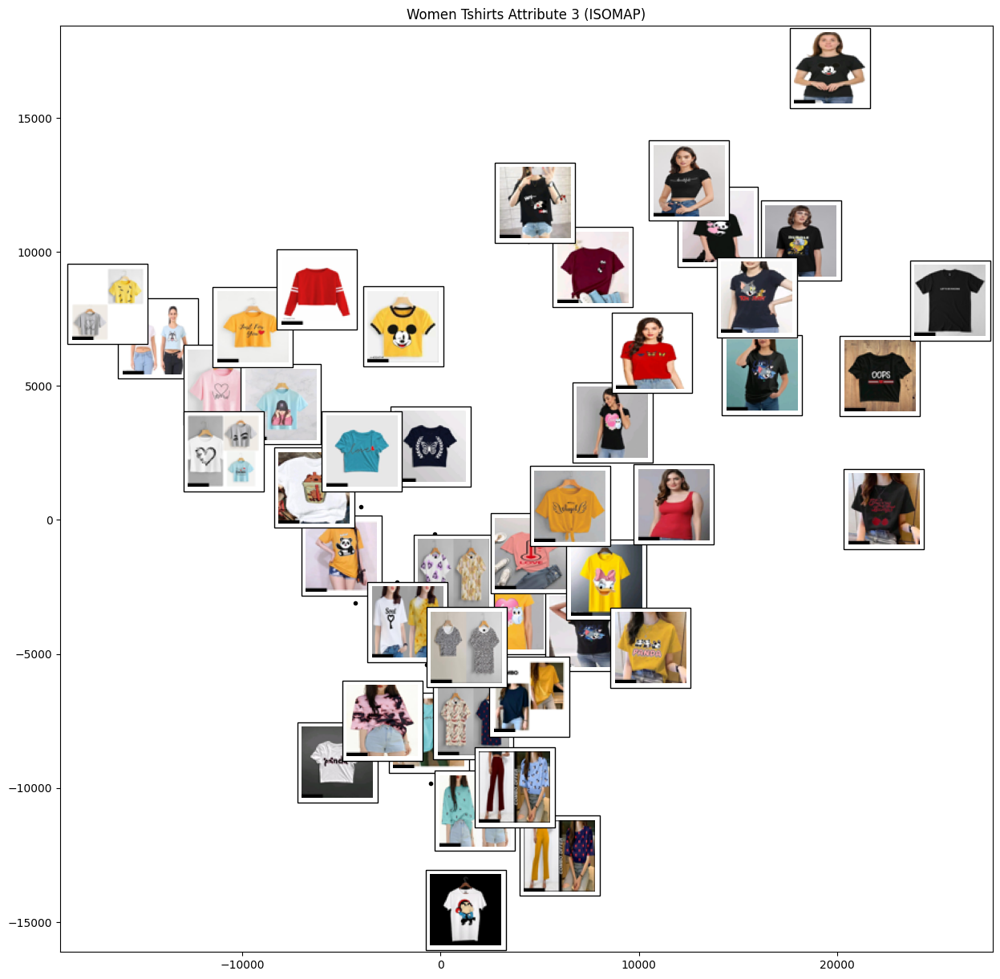

In [121]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Women Tshirts Attribute 3 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the background colour of the pictures transition from dark to light as we move from left to right. Component: Background colour intensity
#### - Along the y-axis, we cant observe any visible pattern.

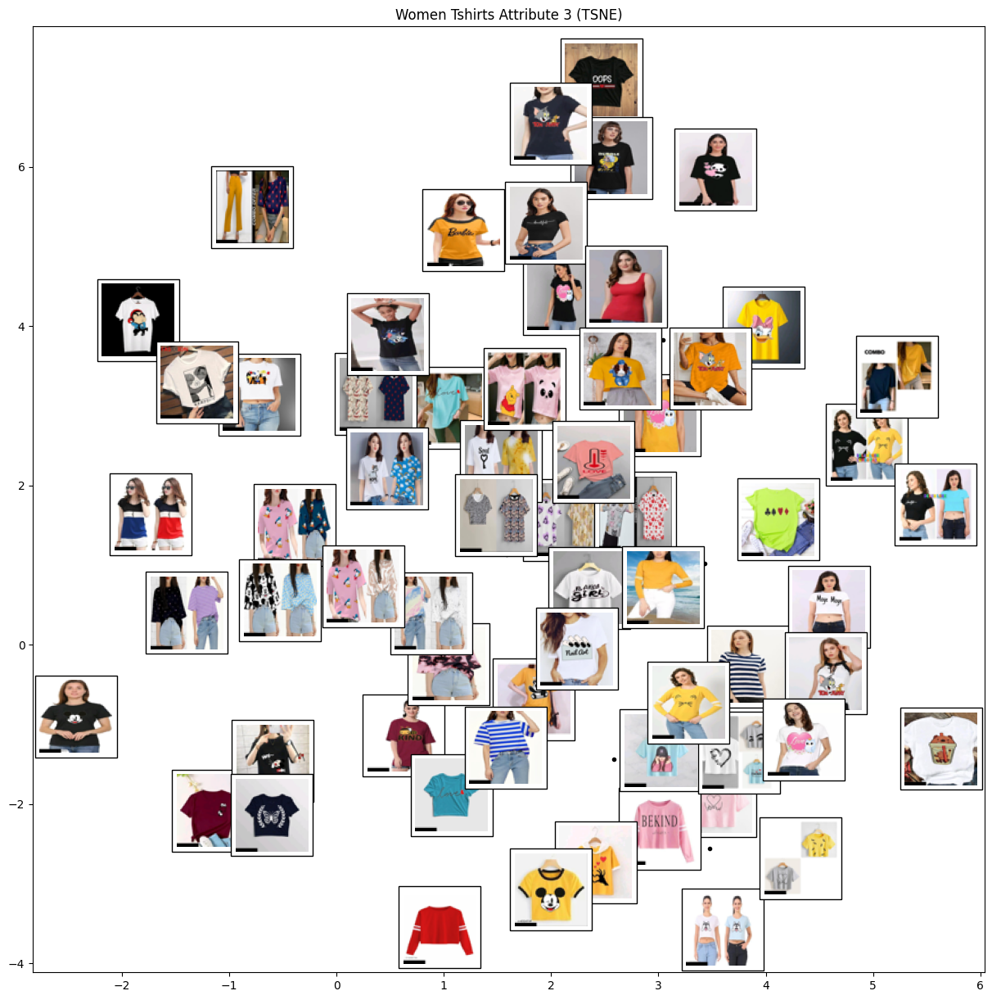

In [122]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title(f"Women Tshirts Attribute 3 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the background colour of the pictures transition from dark to light as we move from left to right. Component: Background colour intensity
#### - Along the y-axis, we observe that the colour of the tshirts transition from dark to light ones from bottom to top. Component: Tshirt colour intensity

## Women Tops & Tunics

In [123]:
category_attr['Women Tops & Tunics']

['attr_10', 'attr_7']

In [124]:
imgs, act_imgs = preprocess_images(samples[f'Women Tops & Tunics-attr_10'])

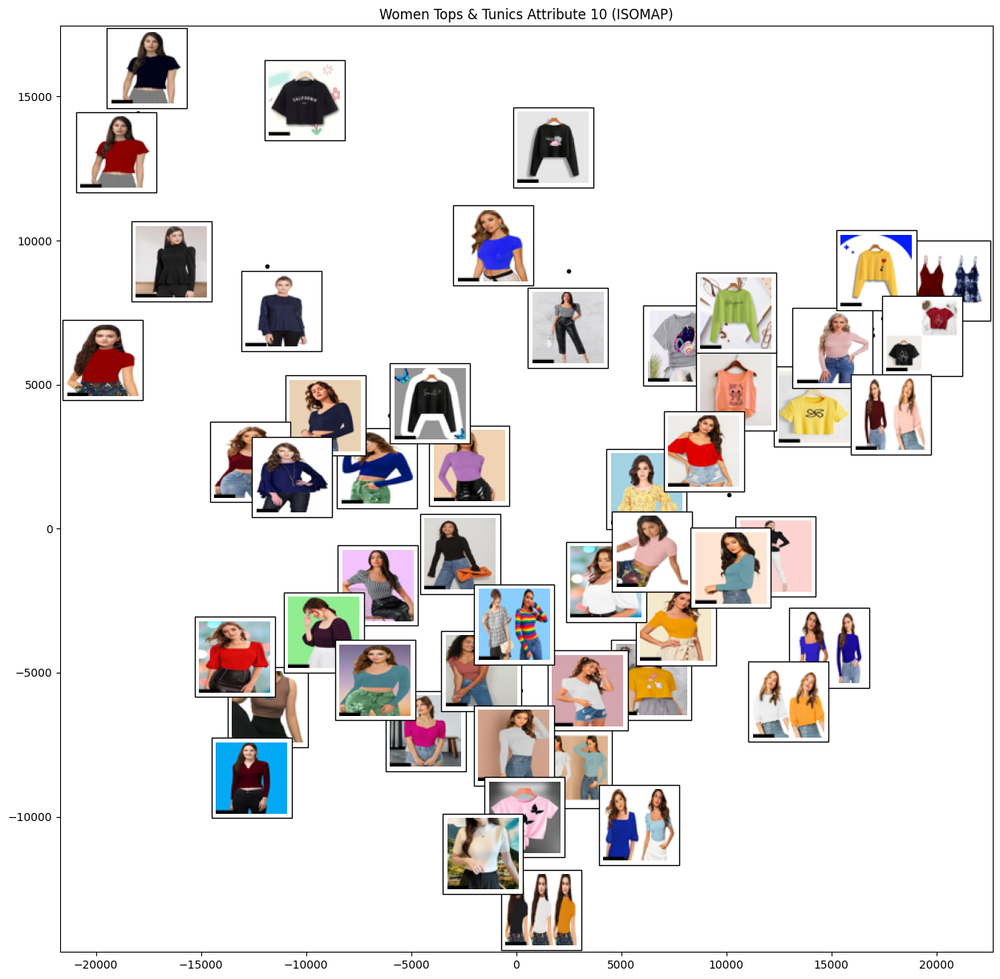

In [125]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Women Tops & Tunics Attribute 10 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### We cant observe any visible patterns from these pictures

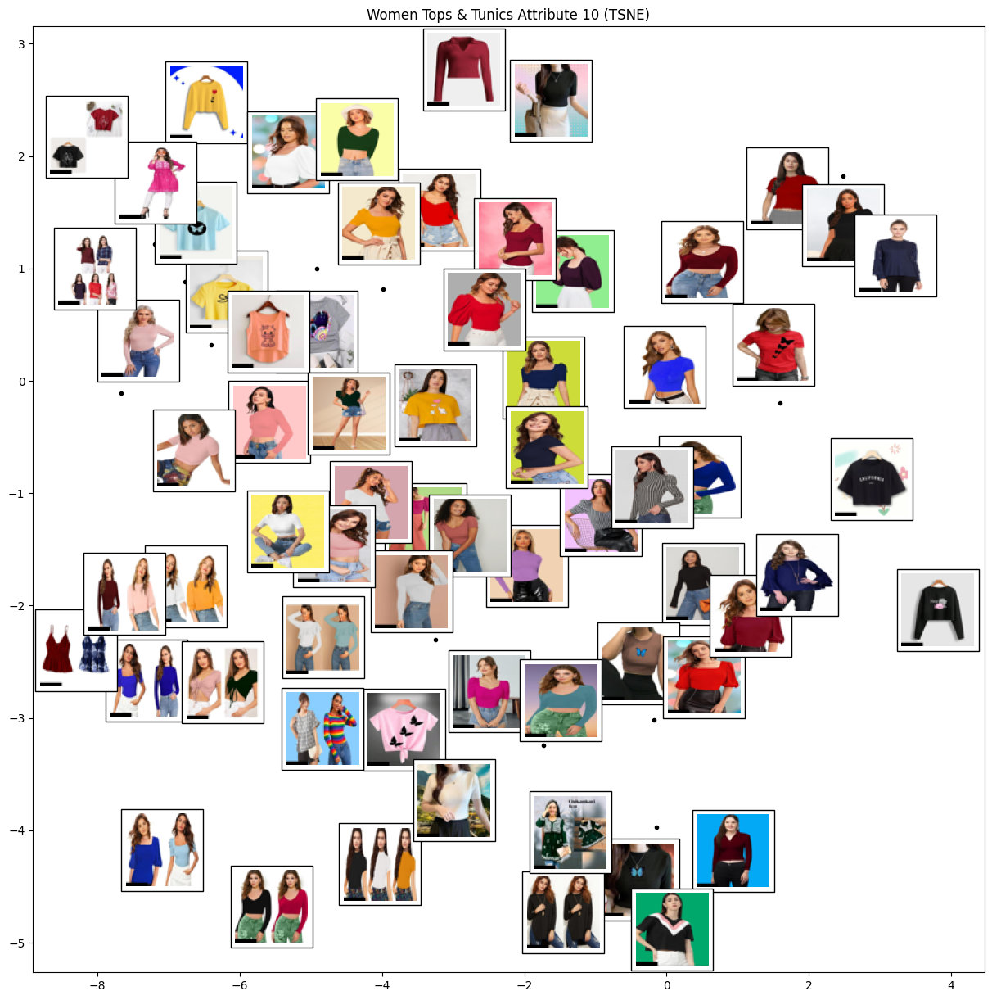

In [126]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title("Women Tops & Tunics Attribute 10 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the colour of the tops lighten as we move from left to right. Component: Top colour intensity
#### - Along the y-axis, we observe that background colour darkens as we move from down to up. The bottomest pictures have white as the background colour and the topmost pictures have black as the background colour. Component: Background colour intensity

In [127]:
imgs, act_imgs = preprocess_images(samples[f'Women Tops & Tunics-attr_7'])

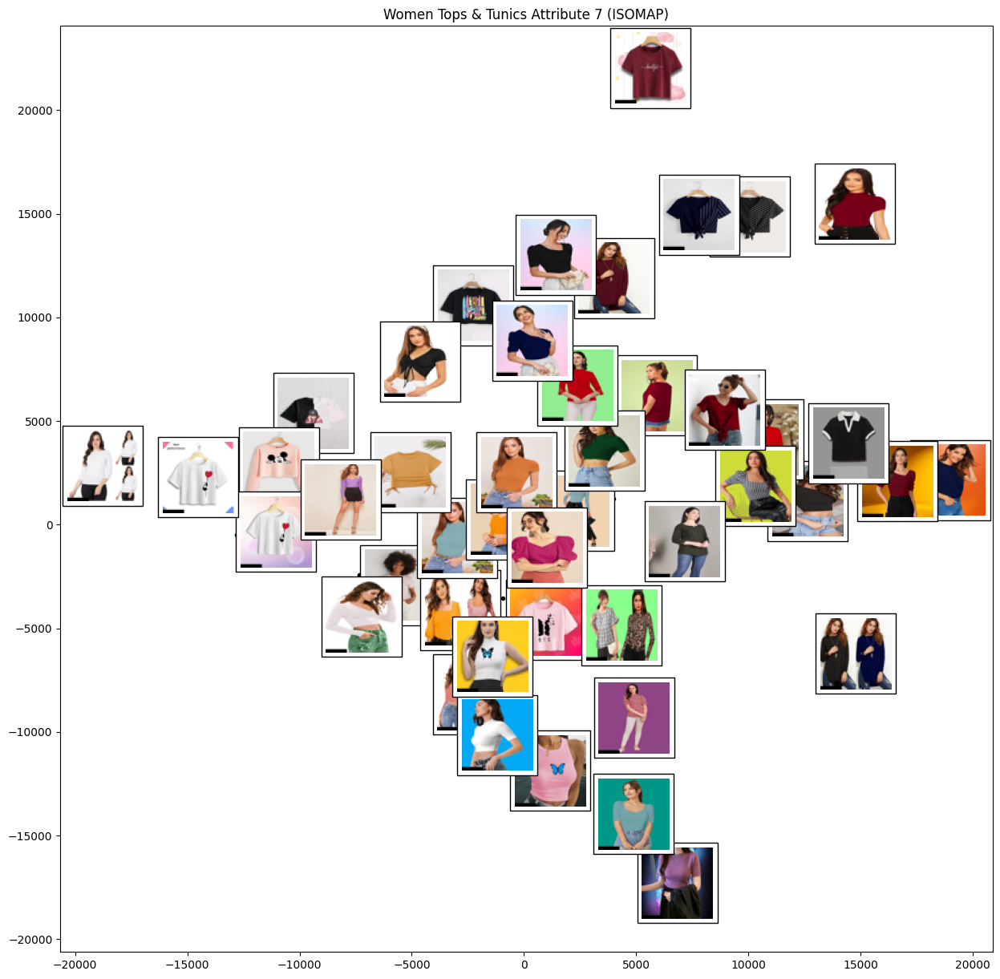

In [128]:
plot_embeddings(imgs,isomap, act_imgs)
plt.title("Women Tops & Tunics Attribute 7 (ISOMAP)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, we observe that the background colour transitions from light to dark as we move from left to right. Component: Background colour intensity
#### - Any visible pattern cannot be observed along the y-axis

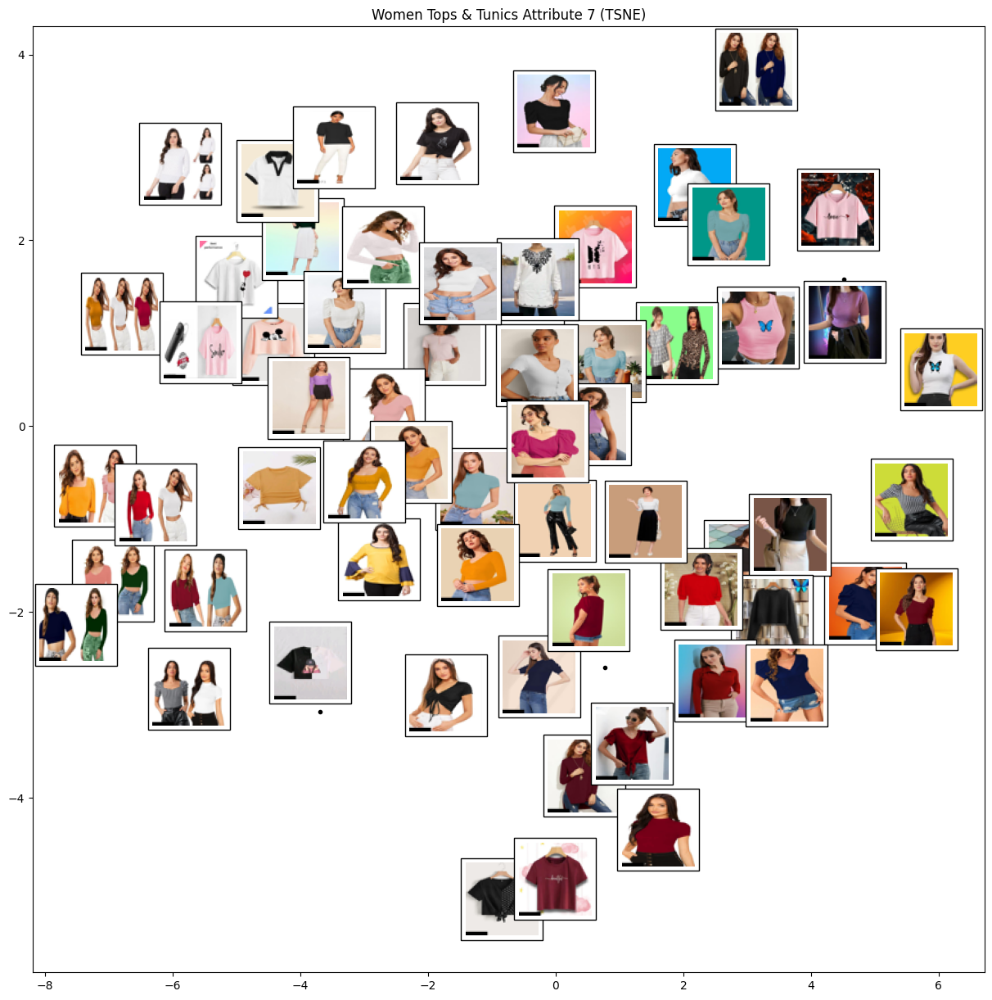

In [129]:
plot_embeddings(imgs,tsne, act_imgs)
plt.title("Women Tops & Tunics Attribute 7 (TSNE)")
plt.gcf().set_size_inches(15, 15)
plt.show()

### Patterns:
#### - Along the x-axis, the pictures with lighter coloured tops are on the right while the darker ones are on the left. Component: Top colour intensity
#### - Along the y-axis,the background colour of the pictures transitions from light (white) to darker ones as we move from down to up. Component: Background colour intensity

## Conclusion

### t-SNE and Isomap are dimensionality reduction techniques that help to visualize high-dimensional data in 2D or 3D. Using these techniques, the images were visualised based on patterns like colour intensity, design intensity, tilt angle. But if the data is very noisy, complex these techniques cannot detect useful patterns. Also, these techniques might identity complex patterns that we might not be able to easily figure out.